In [1]:
import numpy as np
import pandas as pd
import networkx as nx
from itertools import product
from scipy.special import gamma
from itertools import combinations
import matplotlib.pyplot as plt
from collections import defaultdict
from scipy.spatial import distance
from itertools import combinations
import community
from networkx.algorithms import bipartite
from itertools import combinations
from cdlib import algorithms
from sklearn.cluster import DBSCAN
import matplotlib.pyplot as plt
import itertools 
import igraph as ig
from networkx.algorithms.community import k_clique_communities
from sklearn.metrics import mean_squared_error
from dbscan1d.core import DBSCAN1D
from os import listdir
from os.path import isfile, join

In [2]:
def ones_patters(a, n, pat = None):
    if pat == None:
        pat = np.int_(np.ones(n))

    b = np.int_(np.append([0], np.cumsum(pat)))    
    l = []
    for i in range(a.shape[0] - np.sum(pat)): 
        l.append(a[b].reshape(1, -1))
        b = b + 1
        
    return np.concatenate(l, axis = 0)









def FCA_clustering_alp_centers(data, n_interval, threshold = 1):
    max_ = np.max(data)
    min_ = np.min(data)
    interval_space = np.linspace(min_, max_, n_interval + 1)
    '''functions: for row embedding, nodes of attributes derivation, bipart graph cunstructing'''
    def embedding(raw):
        embedding = np.concatenate([[1 if interval_space[i] <= vec_comp <= interval_space[i + 1]
                         else 0 for i in range(interval_space.size - 1)]
                        for vec_comp in raw])
    
        return embedding
    
    def Objects_attributes(nodes, permut):
        comb_permut = list(combinations(nodes, permut))
        nodes_permut = [str(sorted(comb_permut[i])) for i in range(len(comb_permut))]
        
        return np.array(nodes_permut)
    
    def Bigraph(embedding_data):
        G = {}
        for i in range(embedding_data.shape[0]):
            attr_nodes = attributes_encode[embedding_data[i] == 1]
            G[i] = set(np.concatenate([Objects_attributes(attr_nodes, per) for per in range(1, attr_nodes.size + 1)]))

        return G
    '''partitions derivation:'''
    embedding_data = np.array([embedding(raw) for raw in data])
    attributes_encode = np.arange(embedding_data.shape[1])
    G_dict = Bigraph(embedding_data)
    G = nx.Graph(G_dict)
    labels = list(nx.algorithms.community.asyn_lpa_communities(G, seed=0))
    partitions = [[i for i in part if type(i) == int] for part in list(labels)]
#     centers = np.array([np.mean(data[part, :], axis = 0) for part in partitions])
#     partitions = [i for i in partitions if len(i) >= threshold]
#     G_obj = G.subgraph(sum(partitions, [])).copy() 
    
    return partitions, labels






def myfilename(i):
    mypath = 'C:\\Users\\Asus\\Downloads\\fistula_files\\' + str(i) + '\\ts\\'
    onlyfiles = [f for f in listdir(mypath) if isfile(join(mypath, f))]
    
    return [mypath + onlyfiles[i] for i in range(len(onlyfiles))] 


data = [myfilename(i) for i in range(1, 99)]


def normalize(v):
    norm = np.linalg.norm(v)
    if norm == 0: 
        return v
    
    return v / norm


all_vectors = [[normalize(np.load(data[i][j], allow_pickle=True))[-10000:] for j in range(len(data[i]))] for i in range(len(data))]









def PlotCluster_sth(s, part_92_0, x, len_patt, col, w):
    MyPlot = lambda vec_pers_test, k, len_of_vec: plt.scatter(np.arange(k, k + len_patt + 1), vec_pers_test[k : k + len_patt + 1], c = col, s=4)
    for i in sorted(part_92_0, key=len)[- s]:
        MyPlot(x, i, len_patt + 1)
#     plt.plot(np.arange(0, len(x)), x, linewidth=w, c='black')
#     plt.ylim(x.min(), x.max())
#     plt.show()
    
    


In [3]:
def Graph_FCA(n_interval, data):
    max_ = np.max(data)
    min_ = np.min(data)
    interval_space = np.linspace(min_, max_, n_interval + 1)
    '''functions: for row embedding, nodes of attributes derivation, bipart graph cunstructing'''
    def embedding(raw):
        embedding = np.concatenate([[1 if interval_space[i] <= vec_comp <= interval_space[i + 1]
                         else 0 for i in range(interval_space.size - 1)]
                        for vec_comp in raw])

        return embedding

    def Objects_attributes(nodes, permut):
        comb_permut = list(combinations(nodes, permut))
        nodes_permut = [str(sorted(comb_permut[i])) for i in range(len(comb_permut))]

        return np.array(nodes_permut)

    def Bigraph(embedding_data):
        G = {}
        for i in range(embedding_data.shape[0]):
            attr_nodes = attributes_encode[embedding_data[i] == 1]
            G[i] = set(np.concatenate([Objects_attributes(attr_nodes, per) for per in range(1, attr_nodes.size + 1)]))

        return G
    '''partitions derivation:'''
    embedding_data = np.array([embedding(raw) for raw in data])
    attributes_encode = np.arange(embedding_data.shape[1])
    G_dict = Bigraph(embedding_data)
    G = nx.Graph(G_dict)
    return G

In [4]:
data = ones_patters(all_vectors[68][5], 10)

In [25]:
G = Graph_FCA(10, data)

In [26]:
part, lab = FCA_clustering_alp_centers(data, 10)

In [28]:
taken_cl =  [115, 116, 273, 274]

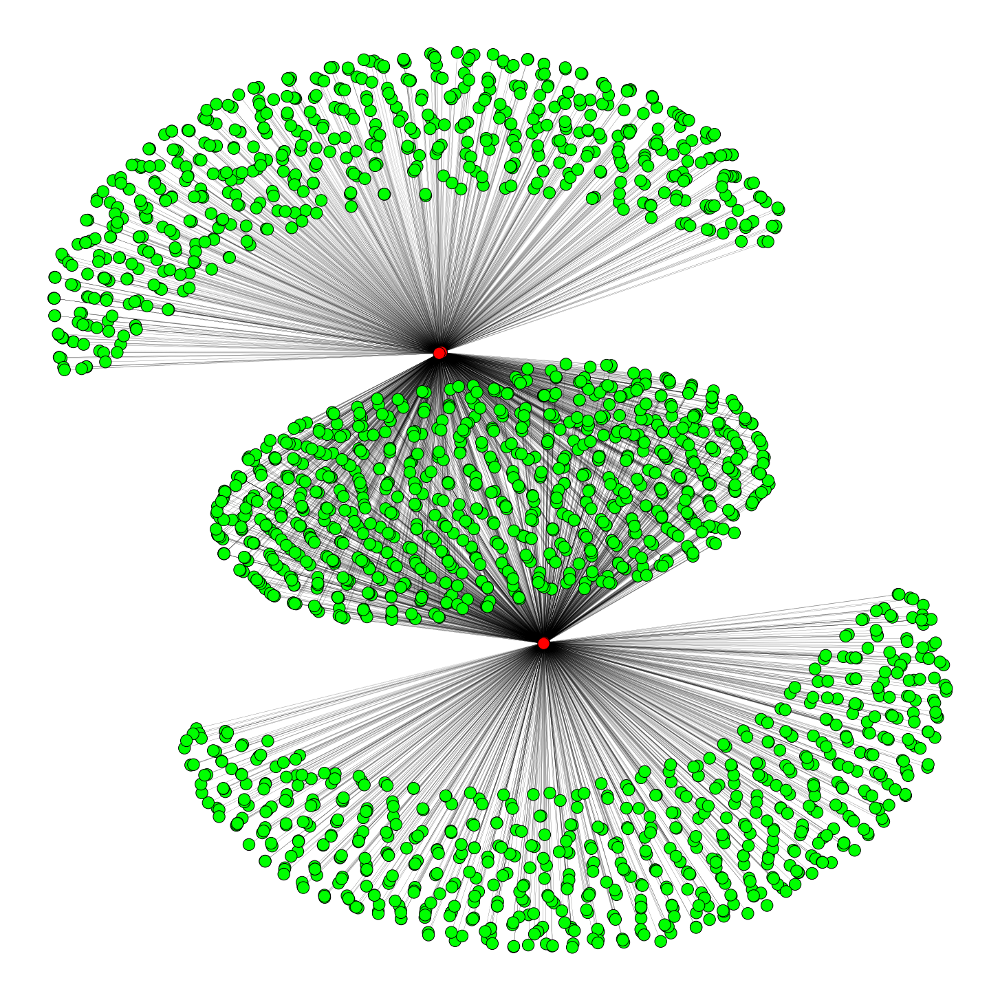

In [63]:
l = [i for i in lab if set(taken_cl) & set(i) == set(taken_cl)]
col = {i: np.array([1, 0, 0]) if i in taken_cl  else np.array([0, 1, 0]) for i in l[0]}
G0 = G.subgraph(l[0]).copy()
pos = nx.spring_layout(G0)
plt.figure(figsize=(20, 20))
nx.draw(G0, node_color=list(col.values()), pos=pos, width=0.1,  linewidths=1, edgecolors='black')
plt.show()

In [123]:
need_nodes = []
nodes_all = []
for i, nod in enumerate(list(G0.nodes)):
    if len(list(nx.neighbors(G0, nod))) <= 4:
        need_nodes.append(nod)
    else:
        nodes_all.append(nod)


[['C:\\Users\\Asus\\Downloads\\fistula_files\\1\\ts\\21-1604457320.npy'],
 ['C:\\Users\\Asus\\Downloads\\fistula_files\\2\\ts\\15-1603267464.npy',
  'C:\\Users\\Asus\\Downloads\\fistula_files\\2\\ts\\15-1603439981.npy',
  'C:\\Users\\Asus\\Downloads\\fistula_files\\2\\ts\\21-1603546241.npy',
  'C:\\Users\\Asus\\Downloads\\fistula_files\\2\\ts\\21-1603719377.npy',
  'C:\\Users\\Asus\\Downloads\\fistula_files\\2\\ts\\21-1604065090.npy',
  'C:\\Users\\Asus\\Downloads\\fistula_files\\2\\ts\\21-1604457393.npy',
  'C:\\Users\\Asus\\Downloads\\fistula_files\\2\\ts\\21-1604717153.npy',
  'C:\\Users\\Asus\\Downloads\\fistula_files\\2\\ts\\21-1604929699.npy',
  'C:\\Users\\Asus\\Downloads\\fistula_files\\2\\ts\\21-1605061825.npy',
  'C:\\Users\\Asus\\Downloads\\fistula_files\\2\\ts\\21-1605320816.npy',
  'C:\\Users\\Asus\\Downloads\\fistula_files\\2\\ts\\21-1605495335.npy',
  'C:\\Users\\Asus\\Downloads\\fistula_files\\2\\ts\\21-1605687565.npy',
  'C:\\Users\\Asus\\Downloads\\fistula_files\\2\\t

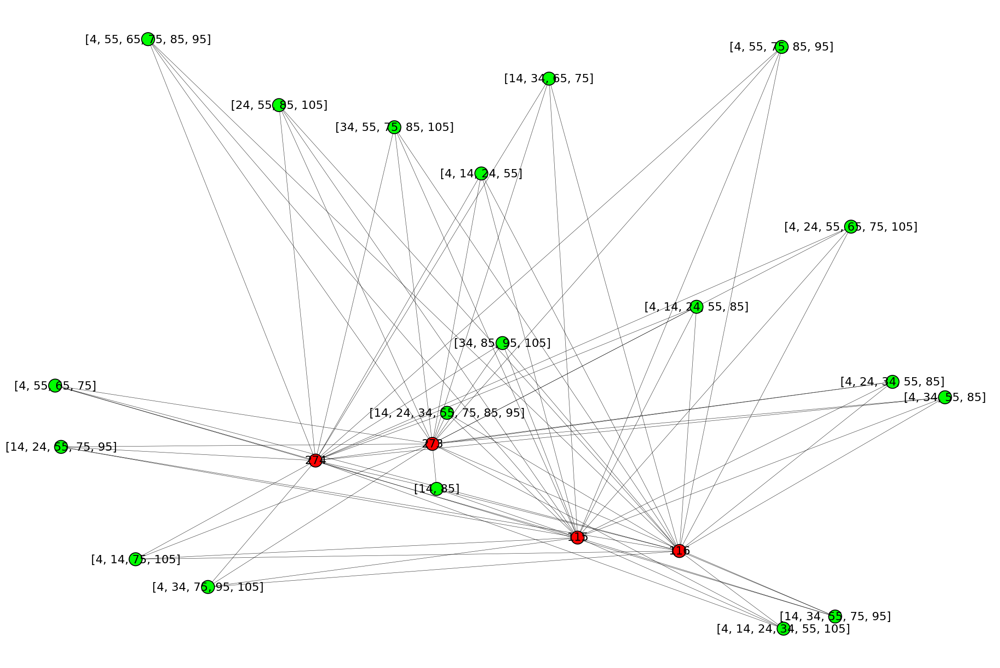

In [136]:
G1 = G0.subgraph(set(np.random.choice(list(set.intersection(* [set(G0.neighbors(i)) for i in taken_cl])), 20).tolist()) | set(taken_cl)).copy()
col = {i: np.array([1, 0, 0]) if i in taken_cl  else np.array([0, 1, 0]) for i in G1.nodes}
pos = nx.random_layout(G1)
plt.figure(figsize=(30, 20))
nx.draw(G1, node_color=list(col.values()), pos=pos, width=0.6,  linewidths=2, edgecolors='black', node_size=800, with_labels=True, font_size=25)
plt.show()

In [139]:
data = ones_patters(all_vectors[59][3], 10)
G = Graph_FCA(10, data)
part, lab = FCA_clustering_alp_centers(data, 10)

In [140]:
len(part)/data.shape[0]

0.9775510204081632

In [142]:
taken_cl = [63, 64, 65, 66]

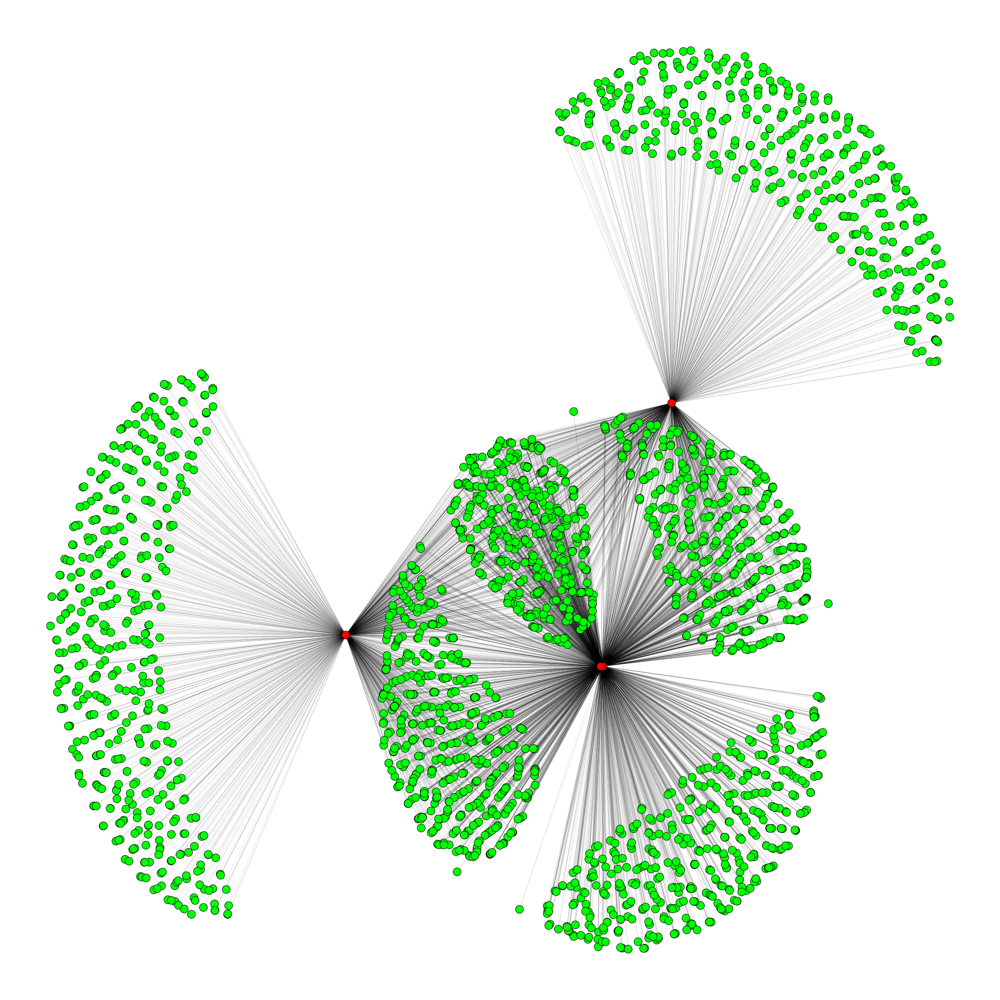

In [144]:
l = [i for i in lab if set(taken_cl) & set(i) == set(taken_cl)]
col = {i: np.array([1, 0, 0]) if i in taken_cl  else np.array([0, 1, 0]) for i in l[0]}
G0 = G.subgraph(l[0]).copy()
pos = nx.spring_layout(G0)
plt.figure(figsize=(30, 30))
nx.draw(G0, node_color=list(col.values()), pos=pos, width=0.1,  linewidths=1, edgecolors='black')
plt.show()

In [147]:
need_nodes = []
nodes_all = []
for i, nod in enumerate(list(G0.nodes)):
    if len(list(nx.neighbors(G0, nod))) <= 3:
        need_nodes.append(nod)
    else:
        nodes_all.append(nod)

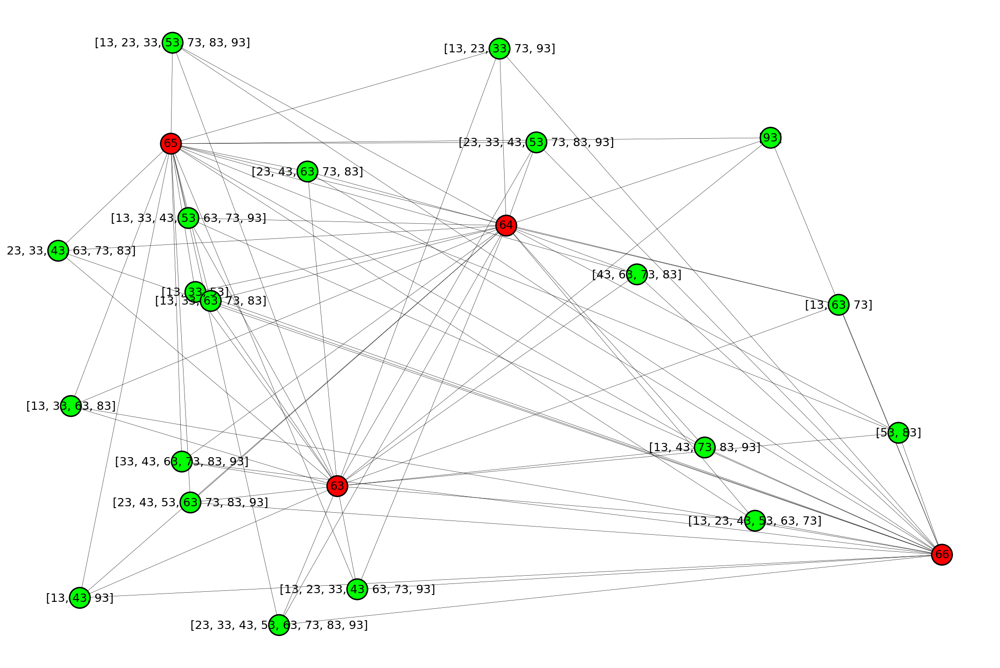

In [156]:
G1 = G0.subgraph(set(np.random.choice(list(set.intersection(* [set(G0.neighbors(i)) for i in taken_cl])), 20).tolist()) | set(taken_cl)).copy()
col = {i: np.array([1, 0, 0]) if i in taken_cl  else np.array([0, 1, 0]) for i in G1.nodes}
pos = nx.random_layout(G1)
plt.figure(figsize=(30, 20))
nx.draw(G1, node_color=list(col.values()), pos=pos, width=0.6,  linewidths=3, edgecolors='black', node_size=2000, with_labels=True, font_size=25)
plt.show()

In [341]:
data = ones_patters(all_vectors[68][5], 5)
G = Graph_FCA(10, data)
part, lab = FCA_clustering_alp_centers(data, 10)
print(len(part)/data.shape[0])
print(len(part))
print(len([i for i in sorted(part, key=len) if len(i)==1]) / data.shape[0])
print(len(sorted(part, key=len)[-1]) / data.shape[0])

0.09090909090909091
45
0.024242424242424242
0.1494949494949495


In [219]:
######BAD

In [352]:
data = ones_patters(all_vectors[59][3], 5)
G = Graph_FCA(10, data)
part, lab = FCA_clustering_alp_centers(data, 10)
print(len(part)/data.shape[0])
print(len(part))
print(len([i for i in sorted(part, key=len) if len(i) == 1]) / data.shape[0])
print(len(sorted(part, key=len)[-1]) / data.shape[0])

0.3292929292929293
163
0.2868686868686869
0.2828282828282828


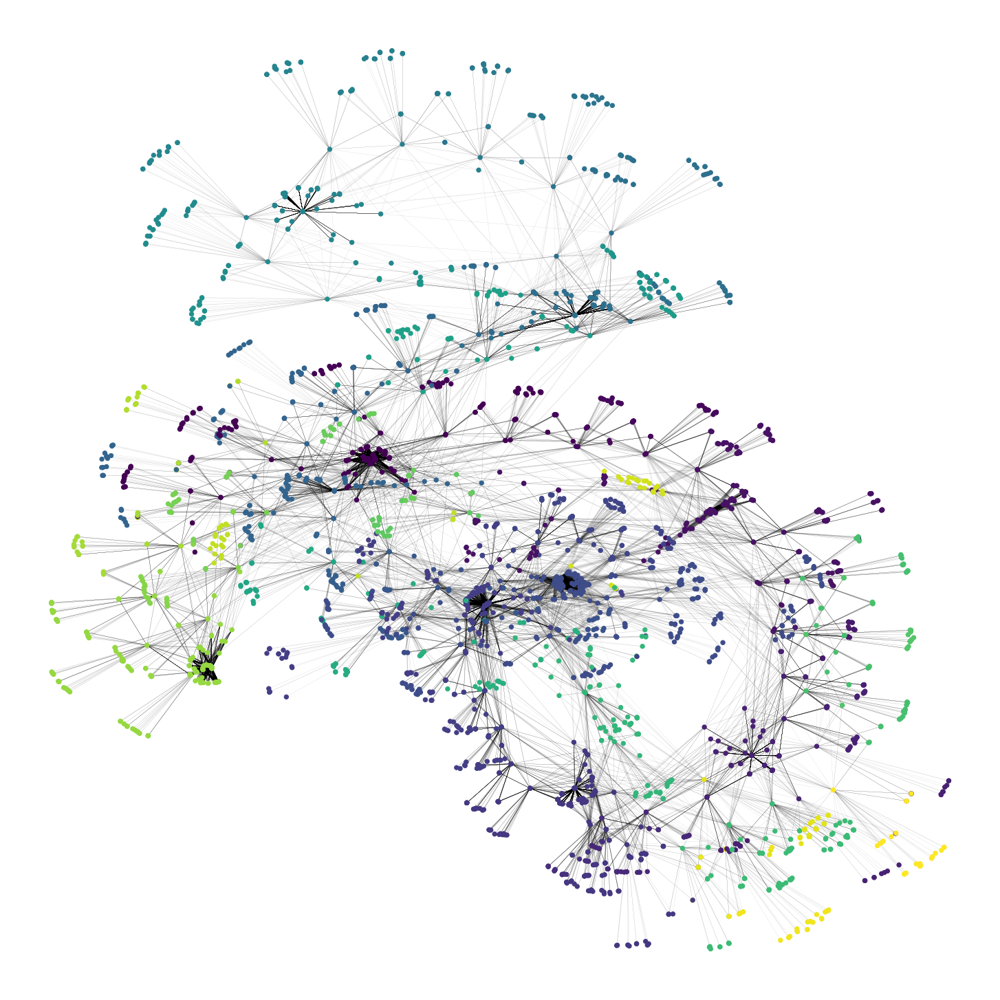

In [235]:
color_map = []
for node in G:
    for i, lab_ in enumerate(lab):
        if node in lab_:
            color_map.append(i)

plt.figure(figsize=(20, 20))
# pos = nx.spring_layout(G)
nx.draw(G, node_color=color_map, node_size=40, width=0.05)
plt.show()

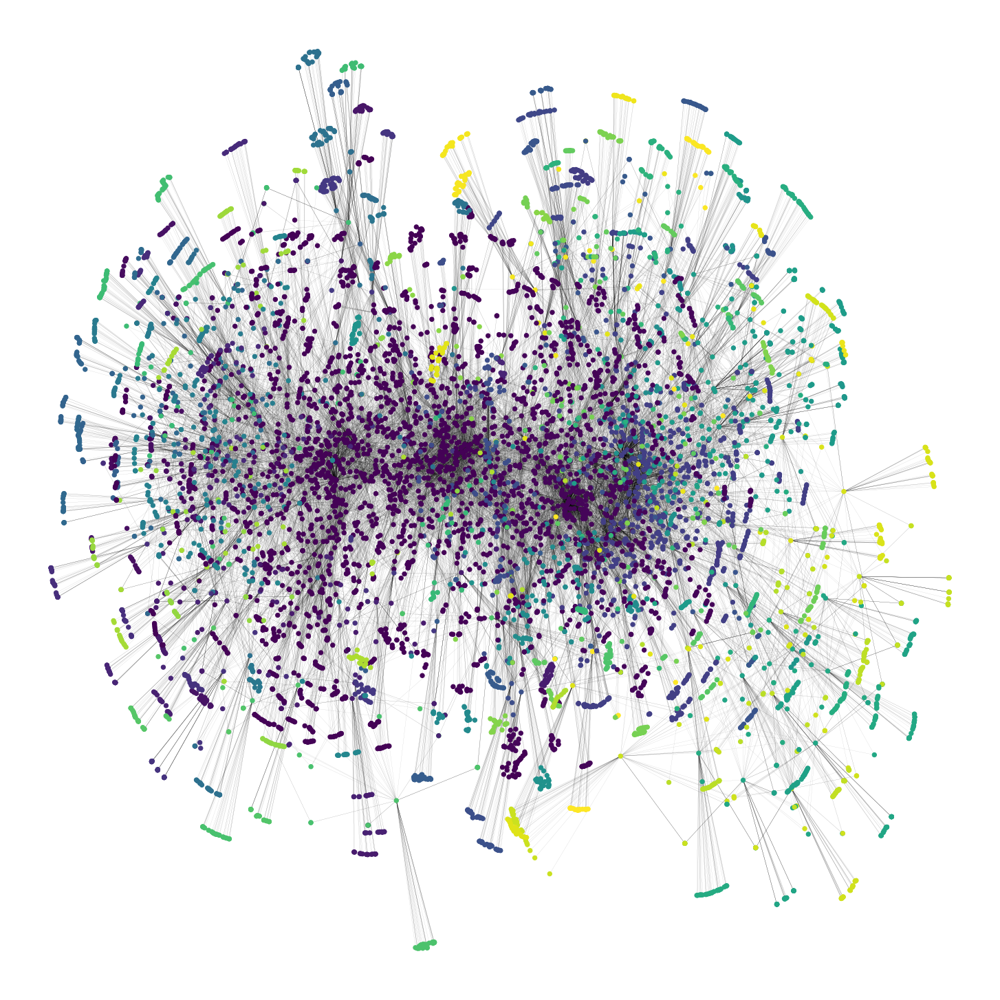

In [240]:
color_map = []
for node in G:
    for i, lab_ in enumerate(lab):
        if node in lab_:
            color_map.append(i)

plt.figure(figsize=(20, 20))
# pos = nx.spring_layout(G)
nx.draw(G, node_color=color_map, node_size=40, width=0.05)
plt.show()

In [ ]:
######GOOD

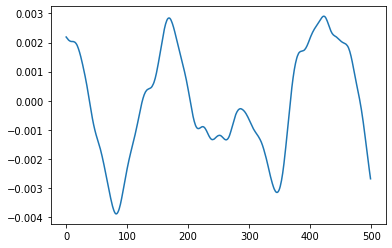

In [172]:
plt.plot(all_vectors[68][5])

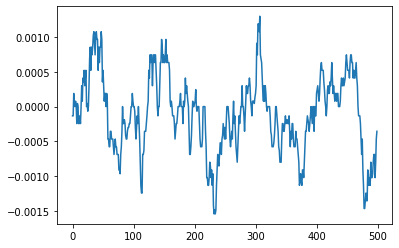

In [173]:
plt.plot(all_vectors[59][3])

In [ ]:
PlotCluster_sth(7, part, all_vectors[59][3], 5)

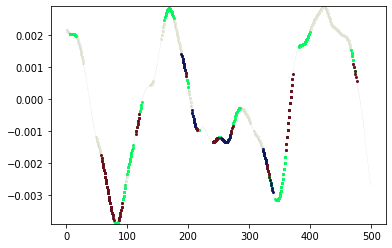

In [365]:
plt.close()
for j in range(1, 5):
    PlotCluster_sth(j, part, all_vectors[68][5], 5, np.random.uniform(0, 1, 3).reshape(1, -1), 0.01)

cluster proportions 0.329
number of clusters 163
proportions of noise clusters 0.287
max cluster proportion 0.283


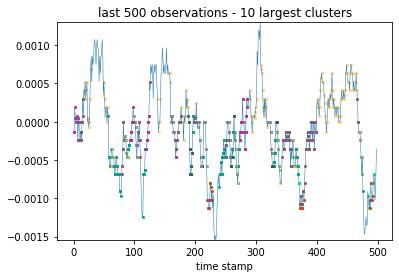

In [405]:
data = ones_patters(all_vectors[59][3], 5)
G = Graph_FCA(10, data)
part, lab = FCA_clustering_alp_centers(data, 10)
print('cluster proportions', round(len(part)/data.shape[0], 3))
print('number of clusters', len(part))
print('proportions of noise clusters', round(len([i for i in sorted(part, key=len) if len(i)==1]) / data.shape[0], 3))
print('max cluster proportion', round(len(sorted(part, key=len)[-1]) / data.shape[0], 3))

x = all_vectors[59][3]
plt.close()
for j in range(1, 10):
    PlotCluster_sth(j, part, x, 5, np.random.uniform(0, 1, 3).reshape(1, -1), 1)
plt.plot(np.arange(0, len(x)), x, linewidth=0.5)
plt.ylim(x.min(), x.max())
plt.title('last 500 observations - 10 largest clusters')
plt.xlabel('time stamp')
plt.show()

cluster proportions 0.091
number of clusters 45
proportions of noise clusters 0.024
max cluster proportion 0.149


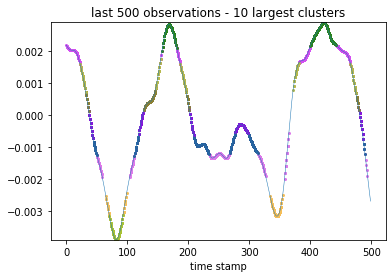

In [410]:
data = ones_patters(all_vectors[68][5], 5)
G = Graph_FCA(10, data)
part, lab = FCA_clustering_alp_centers(data, 10)
print('cluster proportions', round(len(part)/data.shape[0], 3))
print('number of clusters', len(part))
print('proportions of noise clusters', round(len([i for i in sorted(part, key=len) if len(i)==1]) / data.shape[0], 3))
print('max cluster proportion', round(len(sorted(part, key=len)[-1]) / data.shape[0], 3))

x = all_vectors[68][5]
plt.close()
for j in range(1, 10):
    PlotCluster_sth(j, part, x, 5, np.random.uniform(0, 1, 3).reshape(1, -1), 1)
plt.plot(np.arange(0, len(x)), x, linewidth=0.5)
plt.ylim(x.min(), x.max())
plt.title('last 500 observations - 10 largest clusters')
plt.xlabel('time stamp')
plt.show()

In [4]:
DF = pd.read_csv('C:\\Users\\Asus\\Downloads\\results_2021_01_06.csv')

In [5]:
DF = DF[['patient_id', 'patient_nhd', 'filename']].dropna()#.astype(int)

In [7]:
DF

,patient_id,patient_nhd,filename
0,1,1.0,21-1603507328.wav
2,3,2.0,21-1603507863.wav
3,4,3.0,21-1603524866.wav
4,5,4.0,21-1603524919.wav
5,6,5.0,21-1603524967.wav
...,...,...,...
642,24,24.0,22-1606452706.wav
643,47,13.0,22-1606452879.wav
644,47,13.0,22-1606452909.wav
645,25,10.0,22-1606453165.wav


In [202]:
DF = DF.dropna()#.astype(int)

In [205]:
# DF['patient_nhd'] = DF['patient_nhd'].astype(int)

In [147]:
mergdf.shape

(810, 4)

In [148]:
# mergdf[['filename', 'target']].to_excel('targetfca.xlsx')

In [149]:
targets = mergdf[['filename', 'target']]

In [150]:
targets = targets.drop_duplicates()
targets.shape

(526, 2)

In [153]:
targets[targets['filename'] == data[][0]]

,filename,target
610,21-1604477179,1.0


In [158]:
targets = targets[targets.iloc[:, -1] != 0.5]

In [96]:
def myfilename_1(i):
    mypath = 'C:\\Users\\Asus\\Downloads\\fistula_files\\' + str(i) + '\\ts\\'
    onlyfiles = [f for f in listdir(mypath) if isfile(join(mypath, f))]
    
    return [onlyfiles[i].split('.')[0] for i in range(len(onlyfiles))] 


data = [myfilename_1(i) for i in range(1, 99)]

{'21-1603524866',
 '21-1603524967',
 '21-1603525687',
 '21-1603525773',
 '21-1603526142',
 '21-1603526751',
 '21-1603526789',
 '21-1603544417',
 '21-1603545115',
 '21-1603545187',
 '21-1603545587',
 '21-1603546241',
 '21-1603680219',
 '21-1603680255',
 '21-1603680465',
 '21-1603680877',
 '21-1603681342',
 '21-1603698588',
 '21-1603698734',
 '21-1603698824',
 '21-1603698960',
 '21-1603699090',
 '21-1603699310',
 '21-1603699751',
 '21-1603700797',
 '21-1603717551',
 '21-1603717958',
 '21-1603852863',
 '21-1603853241',
 '21-1603853427',
 '21-1603853702',
 '21-1603871428',
 '21-1603871460',
 '21-1603871500',
 '21-1603872109',
 '21-1603890108',
 '21-1603891266',
 '21-1603892817',
 '21-1603893066',
 '21-1604044318',
 '21-1604044371',
 '21-1604044473',
 '21-1604044604',
 '21-1604044729',
 '21-1604045136',
 '21-1604045822',
 '21-1604046088',
 '21-1604063568',
 '21-1604064294',
 '21-1604064397',
 '21-1604065090',
 '21-1604065684',
 '21-1604066352',
 '21-1604285196',
 '21-1604285340',
 '21-16042

In [163]:
set(targets[targets.iloc[:, -1] == 1]['filename']) & set(targets[targets.iloc[:, -1] == 0]['filename'])

{'21-1603524967',
 '21-1603545187',
 '21-1603680465',
 '21-1603717551',
 '21-1603853427',
 '21-1603890108',
 '21-1604065090',
 '21-1604285340',
 '21-1604322369',
 '21-1604323980',
 '21-1604457551',
 '21-1604495386',
 '21-1604495976',
 '21-1605532273',
 '21-1605945681',
 '21-1606136533',
 '21-1606310334',
 '22-1604139482',
 '22-1604397575',
 '22-1604398315',
 '22-1604569924',
 '22-1604637866',
 '22-1605243584',
 '22-1605280038',
 '22-1605607004',
 '22-1605781170'}

In [164]:
DF['patient_nhd']

,patient_id,patient_nhd,filename
0,1,1,21-1603507328
2,3,2,21-1603507863
3,4,3,21-1603524866
4,5,4,21-1603524919
5,6,5,21-1603524967
...,...,...,...
642,24,24,22-1606452706
643,47,13,22-1606452879
644,47,13,22-1606452909
645,25,10,22-1606453165


In [182]:
set(d[d.target == 1]['patient_nhd']) & set(DF['patient_nhd'])

{3,
 5,
 7,
 9,
 10,
 13,
 17,
 20,
 22,
 24,
 25,
 29,
 40,
 42,
 43,
 44,
 47,
 48,
 57,
 65,
 66,
 70,
 71,
 75,
 77,
 81,
 82,
 83,
 88,
 105,
 120,
 124,
 134,
 146,
 1946}

In [8]:
df = pd.read_excel('labelstrue.xlsx')

In [197]:
df['patient_nhd'] = df['patient_nhd'].astype(int)
df['test'] = df['test'].astype(int)

In [210]:

mergdf = df.merge(DF, left_on='patient_nhd', right_on='patient_nhd')

In [212]:
mergdf = mergdf.drop_duplicates()

In [226]:
zero = mergdf[mergdf.target == 0]

In [227]:
mapping = np.array(zero[['patient_id', 'test']])

In [265]:
ones = mergdf[mergdf.target == 1]
ones
mapping1 = np.array(ones[['patient_id', 'test']])


all_vectors__ = []
idx_ = []
for i, j in mapping1:
    try:
        idx_.append([i, j])
        all_vectors__.append(all_vectors[i - 1][j - 1])
    except:
        pass

In [266]:
all_vectors_ = []
idx = []
for i, j in mapping:
    try:
        idx.append([i, j])
        all_vectors_.append(all_vectors[i - 1][j - 1])
    except:
        pass

In [267]:
def ones_patters(a, n, pat = None):
    if pat == None:
        pat = np.int_(np.ones(n))

    b = np.int_(np.append([0], np.cumsum(pat)))    
    l = []
    for i in range(a.shape[0] - np.sum(pat)): 
        l.append(a[b].reshape(1, -1))
        b = b + 1
        
    return np.concatenate(l, axis = 0)









def FCA_clustering_alp_centers(data, n_interval, threshold = 1):
    max_ = np.max(data)
    min_ = np.min(data)
    interval_space = np.linspace(min_, max_, n_interval + 1)
    '''functions: for row embedding, nodes of attributes derivation, bipart graph cunstructing'''
    def embedding(raw):
        embedding = np.concatenate([[1 if interval_space[i] <= vec_comp <= interval_space[i + 1]
                         else 0 for i in range(interval_space.size - 1)]
                        for vec_comp in raw])
    
        return embedding
    
    def Objects_attributes(nodes, permut):
        comb_permut = list(combinations(nodes, permut))
        nodes_permut = [str(sorted(comb_permut[i])) for i in range(len(comb_permut))]
        
        return np.array(nodes_permut)
    
    def Bigraph(embedding_data):
        G = {}
        for i in range(embedding_data.shape[0]):
            attr_nodes = attributes_encode[embedding_data[i] == 1]
            G[i] = set(np.concatenate([Objects_attributes(attr_nodes, per) for per in range(1, attr_nodes.size + 1)]))

        return G
    '''partitions derivation:'''
    embedding_data = np.array([embedding(raw) for raw in data])
    attributes_encode = np.arange(embedding_data.shape[1])
    G_dict = Bigraph(embedding_data)
    G = nx.Graph(G_dict)
    labels = list(nx.algorithms.community.asyn_lpa_communities(G, seed=0))
    partitions = [[i for i in part if type(i) == int] for part in list(labels)]
#     centers = np.array([np.mean(data[part, :], axis = 0) for part in partitions])
#     partitions = [i for i in partitions if len(i) >= threshold]
#     G_obj = G.subgraph(sum(partitions, [])).copy() 
    
    return partitions


In [274]:
for h in all_vectors_[: 4] + all_vectors_[5:]:
    print('---------------')
    data = ones_patters(h, 5)
    part = FCA_clustering_alp_centers(data, 10)
    print('cluster proportions', round(len(part)/data.shape[0], 10))
    print('number of clusters', len(part))
    print('proportions of noise clusters', round(len([i for i in sorted(part, key=len) if len(i)==1]) / data.shape[0], 10))
    print('max cluster proportion', round(len(sorted(part, key=len)[-1]) / data.shape[0], 10))

---------------
cluster proportions 0.0046023012
number of clusters 46
proportions of noise clusters 0.0013006503
max cluster proportion 0.596198099
---------------
cluster proportions 0.0053026513
number of clusters 53
proportions of noise clusters 0.0018009005
max cluster proportion 0.2408204102
---------------
cluster proportions 0.0042021011
number of clusters 42
proportions of noise clusters 0.0014007004
max cluster proportion 0.2966483242
---------------
cluster proportions 0.004002001
number of clusters 40
proportions of noise clusters 0.0010005003
max cluster proportion 0.2588294147
---------------
cluster proportions 0.0086043022
number of clusters 86
proportions of noise clusters 0.0048024012
max cluster proportion 0.7405702851


In [ ]:
for s in all_vectors__:    
    data = ones_patters(s, 5)
    part = FCA_clustering_alp_centers(data, 10)
    print('cluster proportions', round(len(part)/data.shape[0], 10))
    print('number of clusters', len(part))
    print('proportions of noise clusters', round(len([i for i in sorted(part, key=len) if len(i)==1]) / data.shape[0], 3))
    print('max cluster proportion', round(len(sorted(part, key=len)[-1]) / data.shape[0], 3))

cluster proportions 0.0044022011
number of clusters 44
proportions of noise clusters 0.0
max cluster proportion 0.278
cluster proportions 0.0047023512
number of clusters 47
proportions of noise clusters 0.001
max cluster proportion 0.285
cluster proportions 0.0044022011
number of clusters 44
proportions of noise clusters 0.001
max cluster proportion 0.294
cluster proportions 0.0043021511
number of clusters 43
proportions of noise clusters 0.0
max cluster proportion 0.576
cluster proportions 0.0035017509
number of clusters 35
proportions of noise clusters 0.001
max cluster proportion 0.452
cluster proportions 0.0028014007
number of clusters 28
proportions of noise clusters 0.001
max cluster proportion 0.282
cluster proportions 0.0065032516
number of clusters 65
proportions of noise clusters 0.003
max cluster proportion 0.271
cluster proportions 0.0063031516
number of clusters 63
proportions of noise clusters 0.004
max cluster proportion 0.516
cluster proportions 0.0097048524
number of c